## 第8章 决策树和集成学习

In [1]:
## 输出高清图像
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
## 图像显示中文的问题
import matplotlib
matplotlib.rcParams['axes.unicode_minus']=False

import seaborn as sns 
sns.set(font= "Kaiti",style="ticks",font_scale=1.4)

import pandas as pd
pd.set_option("max_colwidth", 200)

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import missingno as msno 

from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import  train_test_split
from sklearn.ensemble import *
from sklearn.tree import *
from sklearn.metrics import *
from io import StringIO
from sklearn.model_selection import GridSearchCV


import graphviz
import pydotplus
from IPython.display import Image  

## 忽略提醒
import warnings
warnings.filterwarnings("ignore")

### 8.1.2 数据准备和探索

In [3]:
## 读取数据泰坦尼克号训练数据
train = pd.read_csv("data/chap8/Titanic train.csv")
## 删除具有精确表示能力的数据列
train = train.drop(["PassengerId","Ticket"],axis = 1)
train.head(5)

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,7.2500,NaN,S
1,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,71.2833,C85,C
2,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,7.9250,NaN,S
3,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,53.1000,C123,S
4,0,3,"Allen, Mr. William Henry",male,35.0,0,0,8.0500,NaN,S


Pclass：船票的等级

SibSp： 在泰坦尼克号上的兄弟姐妹或者配偶数量

parch ：在泰坦尼克号上的父母或者孩子数量

Ticket：船票号码

Fare ： 乘客票价

Cabin ： 客舱号码

Embarked ：登上船的港口


In [4]:
## 读取待预测的数据集
test = pd.read_csv("data/chap8/Titanic test.csv")
## 删除具有精确表示能力的数据列
test = test.drop(["PassengerId","Ticket"],axis = 1)
test.head(5)

,Pclass,Name,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,3,"Kelly, Mr. James",male,34.5,0,0,7.8292,NaN,Q
1,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,7.0000,NaN,S
2,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,9.6875,NaN,Q
3,3,"Wirz, Mr. Albert",male,27.0,0,0,8.6625,NaN,S
4,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,12.2875,NaN,S


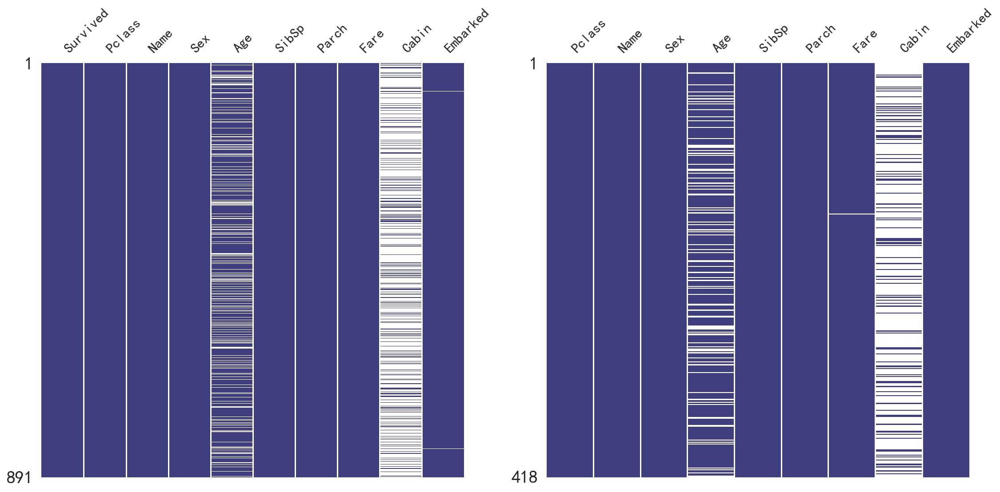

In [5]:
## 可视化训练数据和待预测数据的缺失值情况
fig = plt.figure(figsize = (16,8))
ax = fig.add_subplot(1,2,1)
msno.matrix(train,color=(0.25, 0.25, 0.5),ax = ax,sparkline=False)
ax = fig.add_subplot(1,2,2)
msno.matrix(test,color=(0.25, 0.25, 0.5),ax = ax,sparkline=False)
plt.tight_layout()
plt.show()

## 可以发现Cabin变量的缺失值太多，不具有数据填充的意义，可以直接将其剔除


In [7]:
## 检查缺失值
print("训练集的列缺失值的情况:\n", train.isnull().sum())
print("-"*20)

print("测试集的列缺失值的情况:\n", test.isnull().sum())
print("-"*20)

训练集的列缺失值的情况:
 Survived      0
Pclass        0
Name          0
Sex           0
Age         177
SibSp         0
Parch         0
Fare          0
Cabin       687
Embarked      2
dtype: int64
--------------------
测试集的列缺失值的情况:
 Pclass        0
Name          0
Sex           0
Age          86
SibSp         0
Parch         0
Fare          1
Cabin       327
Embarked      0
dtype: int64
--------------------


In [8]:
train.head()

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,7.2500,NaN,S
1,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,71.2833,C85,C
2,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,7.9250,NaN,S
3,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,53.1000,C123,S
4,0,3,"Allen, Mr. William Henry",male,35.0,0,0,8.0500,NaN,S


In [9]:
## 数据预处理
## 将两个数据集组成一个列表，方便对训练数据和待预测数据作相同的预处理操作
train_pro = train.copy(deep=True)   # 复制数据
test_pro = test.copy(deep=True)     # 复制数据
data_pro = [train_pro,test_pro]

## 数据中的缺失值填补预处理
for dataset in data_pro:    
    # 剔除有大量缺失值的变量Cabin
    dataset.drop("Cabin", axis=1, inplace = True)
    
    # 将性别编码为分类变量
    label = LabelEncoder()
    dataset["Sex"] = label.fit_transform(dataset["Sex"])
    
    #使用中位数来填补乘客的票价
    dataset["Fare"].fillna(dataset["Fare"].median(), inplace = True)
    
    # 对带有缺失值的数值型变量Age，利用多个特征进行最近邻填充
    dataset_imp = dataset[["Pclass","Sex","Age","SibSp","Fare"]]
    # KNNImputer缺失值填补方法
    knnimp = KNNImputer(n_neighbors = 5)
    datasetknn = knnimp.fit_transform(dataset_imp)
    dataset["Age"] = datasetknn[:,2]
    
    #使用众数来填补登上船的港口
    dataset["Embarked"].fillna(dataset["Embarked"].mode()[0], inplace = True)

    
print(train_pro.isnull().sum())
print("-"*20)
print(test_pro.isnull().sum())

Survived    0
Pclass      0
Name        0
Sex         0
Age         0
SibSp       0
Parch       0
Fare        0
Embarked    0
dtype: int64
--------------------
Pclass      0
Name        0
Sex         0
Age         0
SibSp       0
Parch       0
Fare        0
Embarked    0
dtype: int64


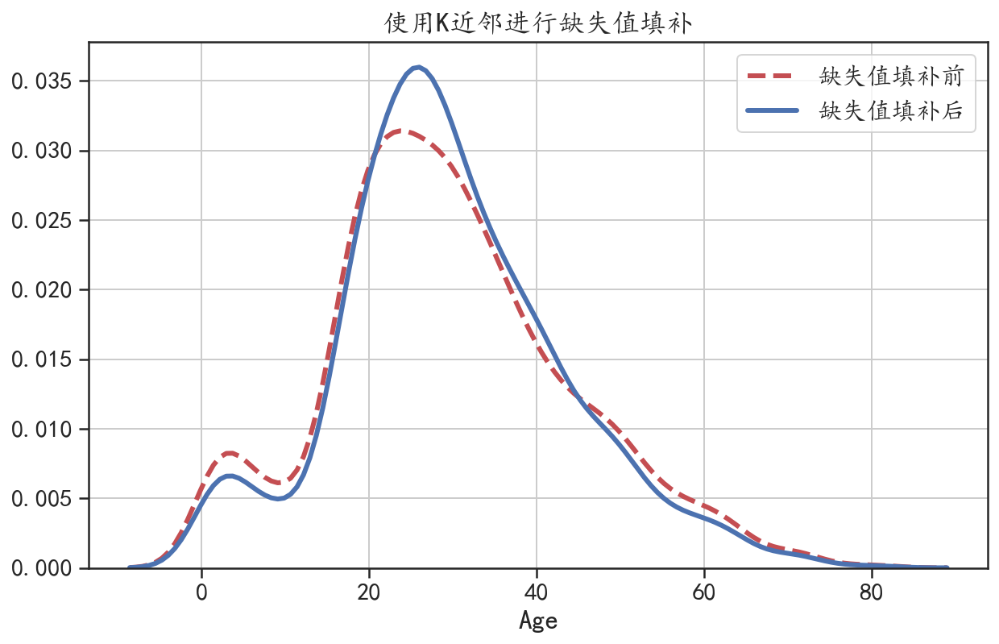

In [10]:
## 可视化年龄变量在进行缺失值预处理前后的分布情况
plt.figure(figsize = (10,6))
sns.distplot(train.Age[~train.Age.isna()],hist=False,label = "缺失值填补前",
             kde_kws={"color": "r", "lw": 3,"bw":3,"ls":"--"})
sns.distplot(train_pro.Age,hist=False,label = "缺失值填补后",
             kde_kws={"color": "b", "lw": 3,"bw":3})
plt.title("使用K近邻进行缺失值填补")
plt.grid()
plt.show()

## 可以发现缺失值填补并没有改变数据的分布情况

In [11]:
train_pro.head()

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Fare,Embarked
0,0,3,"Braund, Mr. Owen Harris",1,22.0,1,0,7.2500,S
1,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",0,38.0,1,0,71.2833,C
2,1,3,"Heikkinen, Miss. Laina",0,26.0,0,0,7.9250,S
3,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",0,35.0,1,0,53.1000,S
4,0,3,"Allen, Mr. William Henry",1,35.0,0,0,8.0500,S


In [12]:
## 对数据集进行特征工程
for dataset in data_pro:    
    # 计算家庭人口在船上的数量
    FamilySize = dataset["SibSp"] + dataset["Parch"] + 1
    ## 添加新的变量，是否独自一人
    dataset["IsAlone"] = 1 
    dataset["IsAlone"].loc[FamilySize > 1] = 0 

    # 提取每个乘客的称谓，例如，先生、女士......
    Tittle = dataset["Name"].str.split(", ", expand=True)[1].str.split(".", expand=True)[0]
    dataset["Name"] = Tittle

In [13]:
## 查看称呼的数量
print(train_pro["Name"].value_counts())
## 查看称呼的数量
print(test_pro["Name"].value_counts())

Mr              517
Miss            182
Mrs             125
Master           40
Dr                7
Rev               6
Mlle              2
Major             2
Col               2
Mme               1
Don               1
Jonkheer          1
Ms                1
the Countess      1
Capt              1
Sir               1
Lady              1
Name: Name, dtype: int64
Mr        240
Miss       78
Mrs        72
Master     21
Col         2
Rev         2
Dr          1
Ms          1
Dona        1
Name: Name, dtype: int64


In [14]:
# 整理称呼,除Mr,Miss,Mrs,Master外使用 Other 代替
for dataset in data_pro:
    names = dataset["Name"].isin(["Mr","Miss","Mrs","Master"])
    dataset["Name"][~names] =  "Other"

print(train_pro["Name"].value_counts())
print("-"*20)
print(test_pro["Name"].value_counts())
print("-"*20)

Mr        517
Miss      182
Mrs       125
Master     40
Other      27
Name: Name, dtype: int64
--------------------
Mr        240
Miss       78
Mrs        72
Master     21
Other       7
Name: Name, dtype: int64
--------------------


In [15]:
# 将字符串类型的分类变量进行重新编码
label = LabelEncoder()
for dataset in data_pro:    
    dataset["Name"] = label.fit_transform(dataset["Name"])
    dataset["Embarked"] = label.fit_transform(dataset["Embarked"])

In [16]:
train_pro.head()

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Fare,Embarked,IsAlone
0,0,3,2,1,22.0,1,0,7.2500,2,0
1,1,1,3,0,38.0,1,0,71.2833,0,0
2,1,3,1,0,26.0,0,0,7.9250,2,1
3,1,1,3,0,35.0,1,0,53.1000,2,0
4,0,3,2,1,35.0,0,0,8.0500,2,1


In [17]:
## 将train_pro保存为文件，以备它用
# train_pro.to_csv("data/chap9/预处理后泰坦尼号训练数据.csv",index=False)


In [18]:
train_pro.columns

Index(['Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp', 'Parch', 'Fare',
       'Embarked', 'IsAlone'],
      dtype='object')

In [19]:
# 定于预测目标变量名
Target = ["Survived"]
## 定义模型的自变量名
train_x = ["Pclass", "Name", "Sex", "Age", "SibSp", "Parch",
           "Fare","Embarked", "IsAlone"]

##将训练集切分为训练集和验证集
X_train,X_val,y_train,y_val = train_test_split(train_pro[train_x], train_pro[Target],
                                               test_size = 0.25,random_state = 1)
print("X_train.shape :",X_train.shape)
print("X_val.shape :",X_val.shape)
print(X_train.head())

X_train.shape : (668, 9)
X_val.shape : (223, 9)
     Pclass  Name  Sex   Age  SibSp  Parch     Fare  Embarked  IsAlone
35        1     2    1  42.0      1      0  52.0000         2        0
46        3     2    1  31.2      1      0  15.5000         1        0
453       1     2    1  49.0      1      0  89.1042         0        0
291       1     3    0  19.0      1      0  91.0792         0        0
748       1     2    1  19.0      1      0  53.1000         2        0


### 8.2 决策树模型


####   8.2.1 决策树模型数据分类


In [20]:
## 先使用默认的参数建立一个决策树模型
dtc1 = DecisionTreeClassifier(random_state=1)
## 使用训练数据进行训练
dtc1 = dtc1.fit(X_train, y_train)
## 输出其在训练数据和验证数据集上的预测精度
dtc1_lab = dtc1.predict(X_train)
dtc1_pre = dtc1.predict(X_val)
print("训练数据集上的精度:",accuracy_score(y_train,dtc1_lab))
print("验证数据集上的精度:",accuracy_score(y_val,dtc1_pre))

## 可以发现建立的模型在训练数据集上的精度为0.99，而在验证集上的精度就至于0.72

训练数据集上的精度: 0.9910179640718563
验证数据集上的精度: 0.726457399103139


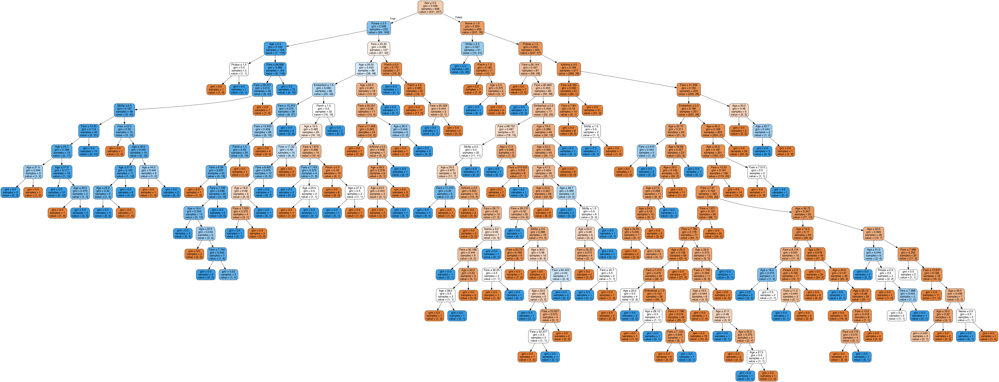

In [21]:
## 将获得的决策树结构可视化
dot_data = StringIO()
export_graphviz(dtc1, out_file=dot_data,
                feature_names=X_train.columns,
                filled=True, rounded=True,special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#### 决策树剪枝缓解过拟合问题

In [22]:
## 借助参数网格搜索找到合适的决策树模型参数
depths = np.arange(3,20,1)
leafnodes = np.arange(10,30,2)
tree_depth = []
tree_leafnode = []
val_acc = []
for depth in depths:
    for leaf in leafnodes:
        dtc2 = DecisionTreeClassifier(max_depth=depth, ## 最大深度
                                      max_leaf_nodes=leaf, ## 最大叶节点数量
                                      min_samples_leaf=5,min_samples_split=2,
                                      random_state=1)
        dtc2 = dtc2.fit(X_train,y_train)
        ## 计算在测试集上的预测精度
        dtc2_pre = dtc2.predict(X_val)
        val_acc.append(accuracy_score(y_val,dtc2_pre))
        tree_depth.append(depth)
        tree_leafnode.append(leaf)
## 将结果组成数据表并输出较好的参数组合
DTCdf = pd.DataFrame(data = {"tree_depth":tree_depth,
                             "tree_leafnode":tree_leafnode,
                             "val_acc":val_acc})
## 根据在验证集上的精度进行排序
print(DTCdf.sort_values("val_acc",ascending=False).head(15))

## 可以发现相同的树深度下，树叶节点数量的影响并不是很大

    tree_depth  tree_leafnode   val_acc
0            3             10  0.811659
1            3             12  0.811659
2            3             14  0.811659
3            3             16  0.811659
4            3             18  0.811659
5            3             20  0.811659
6            3             22  0.811659
7            3             24  0.811659
8            3             26  0.811659
9            3             28  0.811659
99          12             28  0.807175
98          12             26  0.807175
89          11             28  0.807175
88          11             26  0.807175
68           9             26  0.807175


In [23]:
## 使用较合适的参数建立决策树分类器
dtc2 = DecisionTreeClassifier(max_depth=3, ## 最大深度
                              max_leaf_nodes=10, ## 最大叶节点数量
                              min_samples_leaf=5,min_samples_split=2,
                              random_state=1)
dtc2 = dtc2.fit(X_train,y_train)
## 输出其在训练数据和验证数据集上的预测精度
dtc2_lab = dtc2.predict(X_train)
dtc2_pre = dtc2.predict(X_val)
print("训练数据集上的精度:",accuracy_score(y_train,dtc2_lab))
print("验证数据集上的精度:",accuracy_score(y_val,dtc2_pre))

## 此时在训练集上的精度为0.84 < 0.99,在验证集山的精度为0.8116 > 0.72

训练数据集上的精度: 0.842814371257485
验证数据集上的精度: 0.8116591928251121


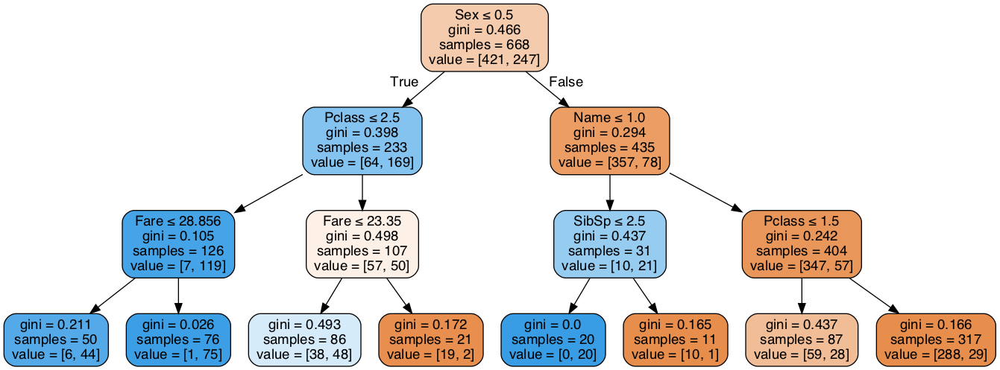

In [24]:
## 可视化决策树经过剪剪枝后的树结构
dot_data = StringIO()
export_graphviz(dtc2, out_file=dot_data,
                feature_names=X_train.columns,
                filled=True, rounded=True,special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

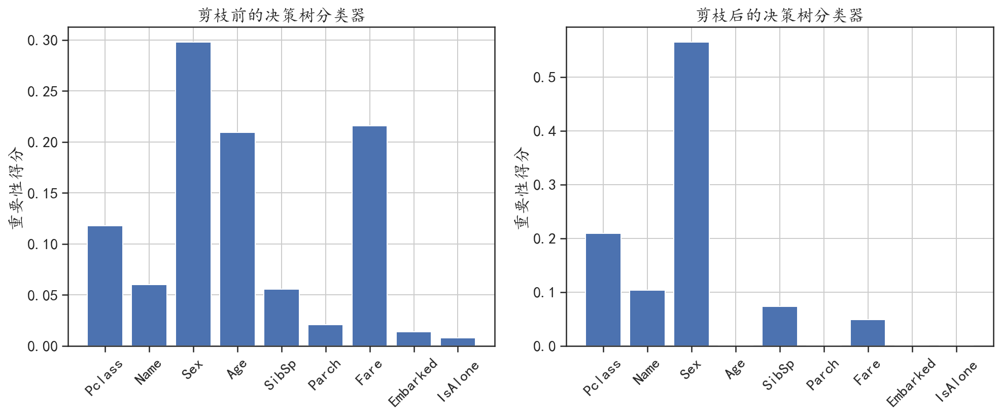

In [25]:
## 可视化决策树在剪枝前后变量重要性的情况
## 使用条形图可视化每个变量的重要性
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
plt.bar(x = train_x,height=dtc1.feature_importances_)
plt.ylabel("重要性得分")
plt.xticks(rotation = 45)
plt.title("剪枝前的决策树分类器")
plt.grid()
plt.subplot(1,2,2)
plt.bar(x = train_x,height=dtc2.feature_importances_)
plt.ylabel("重要性得分")
plt.xticks(rotation = 45)
plt.title("剪枝后的决策树分类器")
plt.grid()
plt.tight_layout()
plt.show()

#### 8.2.2 决策树模型数据回归


In [26]:
## 数据准备
## 读取用于多元回归的数据
enbdf = pd.read_excel("data/chap8/ENB2012.xlsx") 
## 前面使用过该数据集进行回归分析，这里使用决策树回归时不对因变量Y1进行正态化变换
print(enbdf.head())

     X1     X2     X3      X4   X5  X6   X7  X8     Y1
0  0.98  514.5  294.0  110.25  7.0   2  0.0   0  15.55
1  0.98  514.5  294.0  110.25  7.0   3  0.0   0  15.55
2  0.98  514.5  294.0  110.25  7.0   4  0.0   0  15.55
3  0.98  514.5  294.0  110.25  7.0   5  0.0   0  15.55
4  0.90  563.5  318.5  122.50  7.0   2  0.0   0  20.84


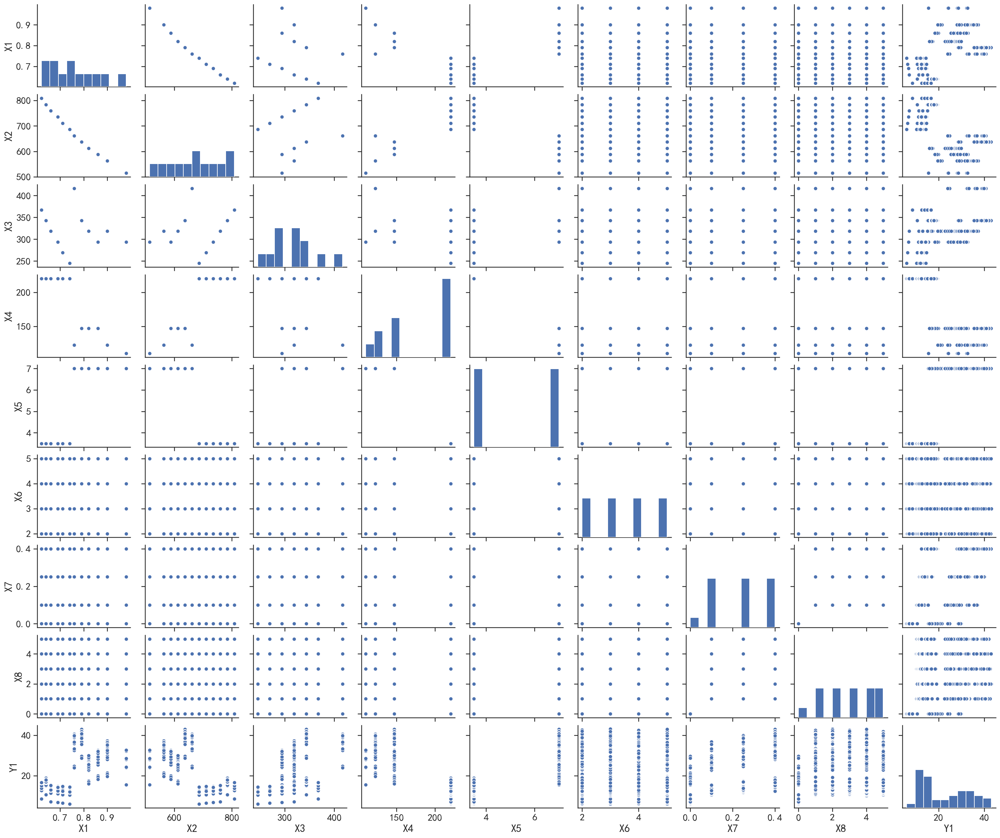

In [27]:
## 使用矩阵散点图对数据进行可视化分析
sns.pairplot(enbdf,height=2,aspect=1.2,diag_kind="hist")
plt.show()


In [28]:
## 将数据切分为训练集和测试集
X_trainenb,X_testenb,y_trainenb,y_testenb = train_test_split(
    enbdf.iloc[:,0:8], enbdf["Y1"],test_size = 0.3,random_state = 1)
print("X_trainenb.shape :",X_trainenb.shape)
print("X_testenb.shape :",X_testenb.shape)
print(X_testenb.head())


## 建立决策树回归模型对数据进行预测,使用默认参数
dtr1 = DecisionTreeRegressor(random_state=1)
dtr1 = dtr1.fit(X_trainenb,y_trainenb)
## 计算在训练和和测试集上的预测均方根误差
dtr1_lab = dtr1.predict(X_trainenb)
dtr1_pre = dtr1.predict(X_testenb)
print("训练数据集上的均方根误差:",mean_squared_error(y_trainenb,dtr1_lab))
print("测试数据集上的均方根误差:",mean_squared_error(y_testenb,dtr1_pre))

## 可以发现在训练集上的MSE约等于0，而在测试集上MSE等于0.393，取值较大

X_trainenb.shape : (537, 8)
X_testenb.shape : (231, 8)
       X1     X2     X3     X4   X5  X6    X7  X8
285  0.62  808.5  367.5  220.5  3.5   3  0.10   5
101  0.90  563.5  318.5  122.5  7.0   3  0.10   2
581  0.90  563.5  318.5  122.5  7.0   3  0.40   2
352  0.79  637.0  343.0  147.0  7.0   2  0.25   2
726  0.90  563.5  318.5  122.5  7.0   4  0.40   5
训练数据集上的均方根误差: 0.0
测试数据集上的均方根误差: 0.39306796536796534


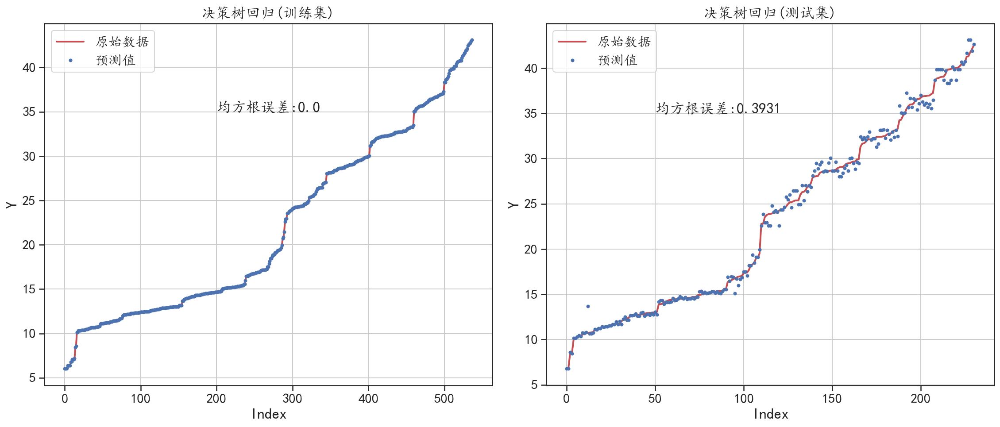

In [29]:
## 可视化出在训练集和测试集上的预测效果
plt.figure(figsize=(16,7))
plt.subplot(1,2,1) ## 训练数据结果可视化
rmse = round(mean_squared_error(y_trainenb,dtr1_lab),4)
index = np.argsort(y_trainenb)
plt.plot(np.arange(len(index)),y_trainenb.values[index],"r",
         linewidth=2, label = "原始数据")
plt.plot(np.arange(len(index)),dtr1_lab[index],"bo",
         markersize=3,label = "预测值")
plt.text(200,35,s = "均方根误差:"+str(rmse))
plt.legend()
plt.grid()
plt.xlabel("Index")
plt.ylabel("Y")
plt.title("决策树回归(训练集)")

plt.subplot(1,2,2)   ## 测试数据结果可视化
rmse = round(mean_squared_error(y_testenb,dtr1_pre),4)
index = np.argsort(y_testenb)
plt.plot(np.arange(len(index)),y_testenb.values[index],"r",
         linewidth=2, label = "原始数据")
plt.plot(np.arange(len(index)),dtr1_pre[index],"bo",
         markersize=3,label = "预测值")
plt.text(50,35,s = "均方根误差:"+str(rmse))
plt.legend()
plt.grid()
plt.xlabel("Index")
plt.ylabel("Y")
plt.title("决策树回归(测试集)")
plt.tight_layout()
plt.show()

## 可以发现在训练集上能够完全拟合数据但是在测试集上却有较大的预测误差，说明模型发生了一定程度的过拟合


In [30]:
## 可视化此时的决策树结构
dot_data = StringIO()
export_graphviz(dtr1, out_file=dot_data,
                feature_names=X_trainenb.columns,
                filled=True, rounded=True,special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

## 可获得一个结构非常复查的回归树，不利于分析树的结构

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.797348 to fit



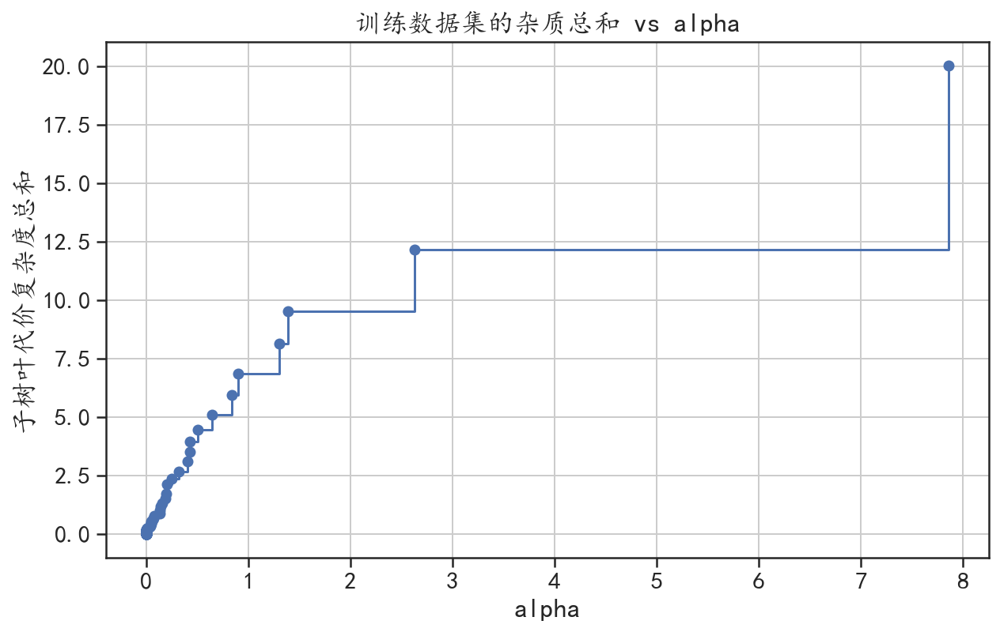

In [31]:
## 利用最小代价复杂度(Cost-Complexity)剪枝
dtr1path = dtr1.cost_complexity_pruning_path(X_trainenb,y_trainenb)
## ccp_alphas:修剪树时的alpha,impurities:子树叶代价复杂度总和
ccp_alphas,impurities = dtr1path.ccp_alphas,dtr1path.impurities
ccp_alphas = ccp_alphas[:-1]   ## 最后alpha对应着只用一个跟节点的树
impurities = impurities[:-1]
## 可视化出相应的图像
plt.figure(figsize=(10,6))
plt.plot(ccp_alphas, impurities, marker="o", drawstyle="steps-post")
plt.xlabel("alpha")
plt.ylabel("子树叶代价复杂度总和")
plt.title("训练数据集的杂质总和 vs alpha")
plt.grid()
plt.show()

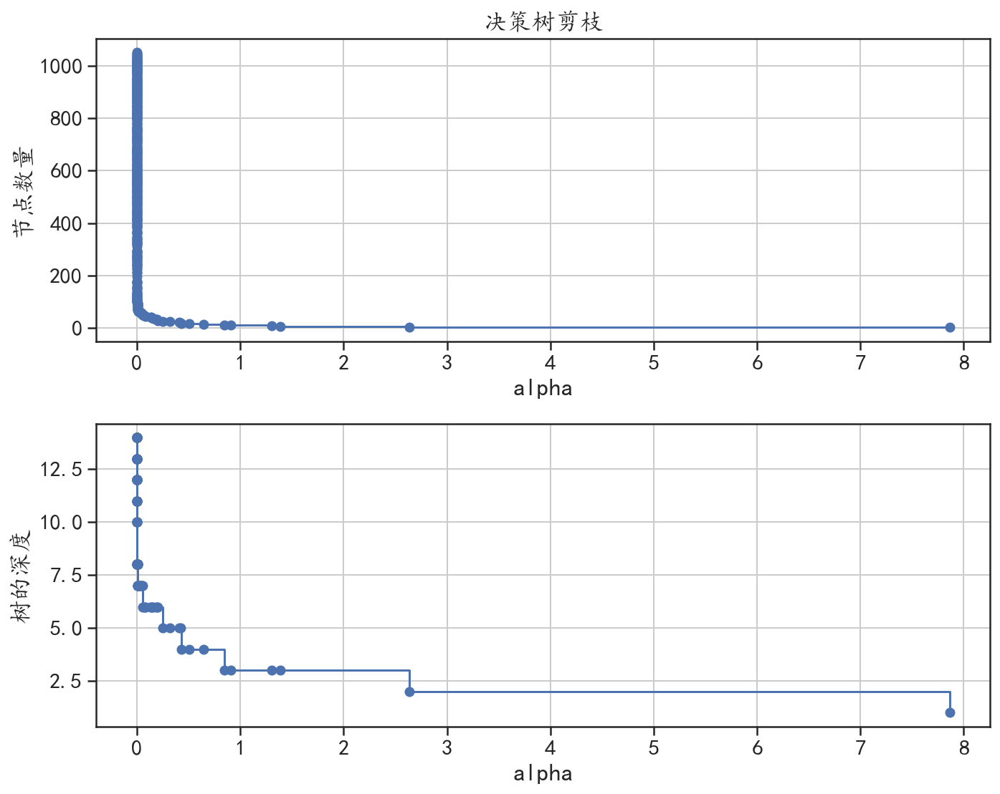

In [32]:
## 使用不同alpha在训练集上训练决策树回归模型
dtrs = []
for ccp_alpha in ccp_alphas:
    dtr = DecisionTreeRegressor(random_state=1, ccp_alpha=ccp_alpha)
    dtr.fit(X_trainenb, y_trainenb)
    dtrs.append(dtr)

## 计算在每个不同alpha下决策树对应的节点数量和深度
node_counts = [dtr.tree_.node_count for dtr in dtrs]
depth = [dtr.tree_.max_depth for dtr in dtrs]
plt.figure(figsize=(10,8))
plt.subplot(2,1,1)
plt.plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
plt.xlabel("alpha")
plt.ylabel("节点数量")
plt.grid()
plt.title("决策树剪枝")
plt.subplot(2,1,2)
plt.plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
plt.xlabel("alpha")
plt.ylabel("树的深度")
plt.grid()
plt.tight_layout()
plt.show()

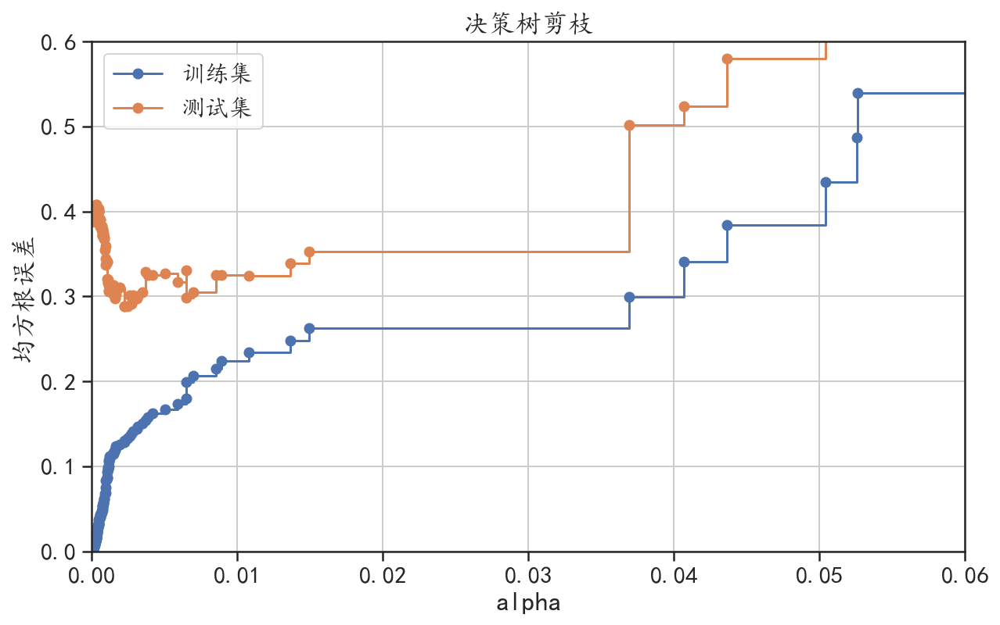

In [33]:
## 计算不同alpha下在训练集和测试集上的均方根误差
train_mse = [mean_squared_error(y_trainenb,dtr.predict(X_trainenb)) for dtr in dtrs]
test_mse = [mean_squared_error(y_testenb,dtr.predict(X_testenb)) for dtr in dtrs]
plt.figure(figsize=(10,6))
plt.plot(ccp_alphas, train_mse, marker="o", drawstyle="steps-post",
         label = "训练集")
plt.plot(ccp_alphas, test_mse, marker="o", drawstyle="steps-post",
        label = "测试集")
plt.xlabel("alpha")
plt.ylabel("均方根误差")
plt.grid()
plt.legend()
plt.title("决策树剪枝")
plt.xlim([0,0.06]) ## 调整可视化的区域
plt.ylim([0,0.6])
plt.show()

## 可以发现在alpha开始增加的初期，在在训练集上的均方根误差一直增大，测试集上的均方根误差有一个减小的趋势

In [34]:
## 找到最合适的alpha取值，并拟合决策树回归模型
index = np.argmin(test_mse)
print("在训练集上的预测误差为:",train_mse[index])
print("在测试集上的预测误差为:",test_mse[index])

在训练集上的预测误差为: 0.1281863479763169
在测试集上的预测误差为: 0.2888941812068635


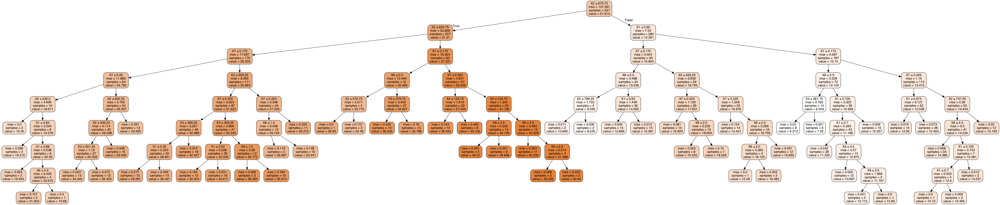

In [35]:
## 可视化此时的决策树回归模型的结构
dot_data = StringIO()
export_graphviz(dtrs[index], out_file=dot_data,
                feature_names=X_trainenb.columns,
                filled=True, rounded=True,special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

## 树的结构复杂度大大的减小

### 8.3 随机森林模型
  

#### 8.3.1 随机森林模型数据分类


In [36]:
## 使用随机森林对泰坦尼克数据进行分类
rfc1 = RandomForestClassifier(n_estimators = 100, # 树的数量
                              max_depth= 5,       # 子树最大深度
                              oob_score=True, 
                              class_weight = "balanced",
                              random_state=1)
rfc1.fit(X_train,y_train)
## 输出其在训练数据和验证数据集上的预测精度
rfc1_lab = rfc1.predict(X_train)
rfc1_pre = rfc1.predict(X_val)
print("随机森林的OOB score:",rfc1.oob_score_)
print("训练数据集上的精度:",accuracy_score(y_train,rfc1_lab))
print("验证数据集上的精度:",accuracy_score(y_val,rfc1_pre))

随机森林的OOB score: 0.8233532934131736
训练数据集上的精度: 0.8562874251497006
验证数据集上的精度: 0.8116591928251121


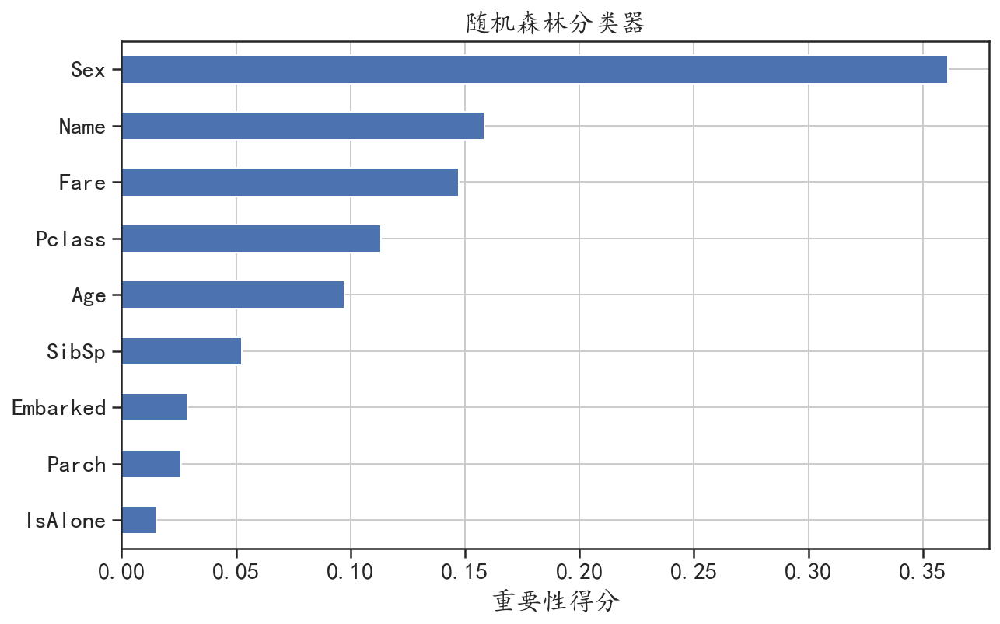

In [37]:
## 使用条形图可视化每个变量的重要性
importances = pd.DataFrame({"feature":train_x,
                            "importance":rfc1.feature_importances_})
importances = importances.sort_values("importance",ascending = True)
importances.plot(kind="barh",figsize=(10,6),x = "feature",y = "importance",
                 legend = False)
plt.xlabel("重要性得分")
plt.ylabel("")
plt.title("随机森林分类器")
plt.grid()
plt.show()

In [38]:
## 可视化不同的决策树数量所对应的OOB score和在验证集精度的变化情况
oobscore = []
test_acc = []
numbers = np.arange(50,301,5)
for n in numbers:
    rfc1.set_params(n_estimators = n)
    rfc1.fit(X_train,y_train)
    oobscore.append(rfc1.oob_score_)
    ##  计算在验证集上的精度
    rfc1_pre = rfc1.predict(X_val)
    test_acc.append(accuracy_score(y_val,rfc1_pre))

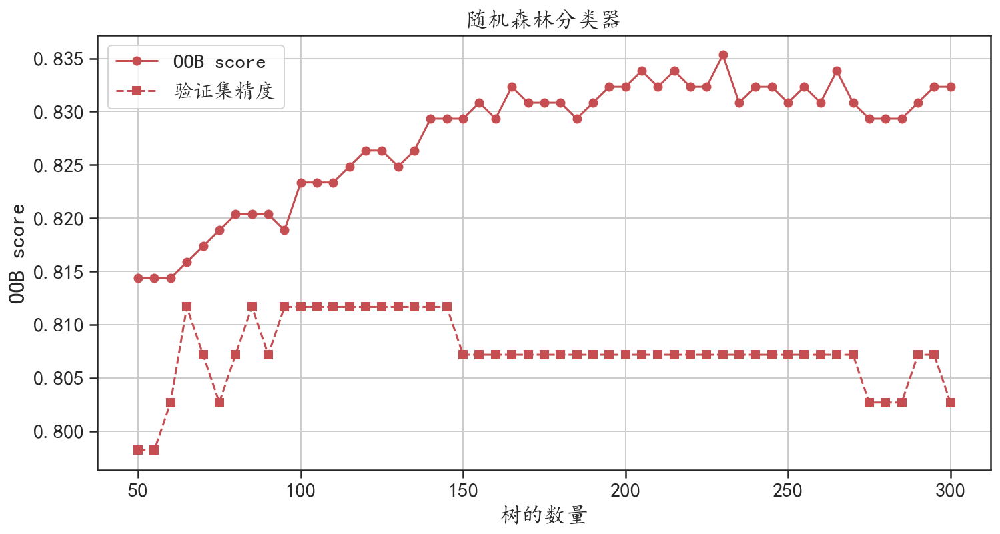

In [39]:
## 可视化
plt.figure(figsize=(12,6))
plt.plot(numbers,oobscore,"r-o",label = "OOB score")
plt.plot(numbers,test_acc,"r--s",label = "验证集精度")
plt.grid()
plt.xlabel("树的数量")
plt.ylabel("OOB score")
plt.title("随机森林分类器")
plt.legend()
plt.show()

## 可以发现当树的数量变化的时候，OOB score的波动性较强
## 并且在验证集上精度的变化较稳定

In [40]:
## 使用网格搜索寻找合适的参数
## 定义模型
rfgs = RandomForestClassifier(oob_score=True, random_state=1)
## 定义需要搜索的参数
n_estimators = [100,200,500,800]
max_depth = [3,5,8,10,15]
class_weight = ["balanced","balanced_subsample"]
criterion = ["gini","entropy"]
max_features = ["sqrt","log2"]
para_grid = [{"n_estimators":n_estimators,"max_depth" : max_depth,
              "class_weight":class_weight,"criterion":criterion,
              "max_features":max_features}]

## 使用5折交叉验证进行参数搜索
gs_rf = GridSearchCV(estimator=rfgs,param_grid=para_grid,cv=5,n_jobs=4)
gs_rf.fit(train_pro[train_x], train_pro[Target]) # 使用训练集的全部数据
## 输出模型最好的参数组合和得分
print(gs_rf.best_params_) 
print(gs_rf.best_score_)  
## 平均的预测精度为0.8316

{'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 10, 'max_features': 'sqrt', 'n_estimators': 800}
0.8327663046889713


In [41]:
## 将输出的所有搜索结果进行处理
results = pd.DataFrame(gs_rf.cv_results_)
## 输出感兴趣的结果
results2 = results[["mean_test_score","std_test_score","params"]]
results2.sort_values("mean_test_score",ascending=False).head()

,mean_test_score,std_test_score,params
31,0.832766,0.022900,"{'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 10, 'max_features': 'log2', 'n_estimators': 800}"
27,0.832766,0.022900,"{'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 10, 'max_features': 'sqrt', 'n_estimators': 800}"
30,0.832766,0.024499,"{'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 10, 'max_features': 'log2', 'n_estimators': 500}"
26,0.832766,0.024499,"{'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 10, 'max_features': 'sqrt', 'n_estimators': 500}"
149,0.831636,0.024442,"{'class_weight': 'balanced_subsample', 'criterion': 'entropy', 'max_depth': 10, 'max_features': 'log2', 'n_estimators': 200}"


In [42]:
## 使用参数搜索的最好模型对测试集进行预测
bestrf = gs_rf.best_estimator_
test_pre = bestrf.predict(test_pro[train_x])
test_pre

array([0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1,
       1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1,
       1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0,
       1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0,
       1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,

####  8.3.2 随机森林模型数据回归


In [43]:
## 使用随机森林进行回归模型的建立
rfr1 = RandomForestRegressor(n_estimators=600,random_state = 1)
rfr1 = rfr1.fit(X_trainenb,y_trainenb)
## 计算在训练和和测试集上的预测均方根误差
rfr1_lab = rfr1.predict(X_trainenb)
rfr1_pre = rfr1.predict(X_testenb)
print("训练数据集上的均方根误差:",mean_squared_error(y_trainenb,rfr1_lab))
print("测试数据集上的均方根误差:",mean_squared_error(y_testenb,rfr1_pre))

## 可以发现在训练集上的MSE约等于0，而在测试集上MSE等于0.393，取值较大

训练数据集上的均方根误差: 0.03931814098863973
测试数据集上的均方根误差: 0.2732304439548806


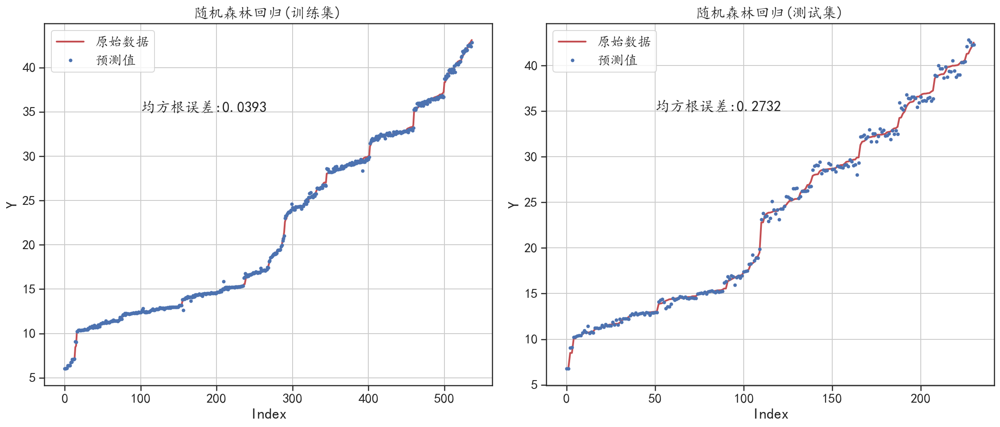

In [44]:
## 可视化出在训练集和测试集上的预测效果
plt.figure(figsize=(16,7))
plt.subplot(1,2,1) ## 训练数据结果可视化
rmse = round(mean_squared_error(y_trainenb,rfr1_lab),4)
index = np.argsort(y_trainenb)
plt.plot(np.arange(len(index)),y_trainenb.values[index],"r",
         linewidth=2, label = "原始数据")
plt.plot(np.arange(len(index)),rfr1_lab[index],"bo",
         markersize=3,label = "预测值")
plt.text(100,35,s = "均方根误差:"+str(rmse))
plt.legend()
plt.grid()
plt.xlabel("Index")
plt.ylabel("Y")
plt.title("随机森林回归(训练集)")

plt.subplot(1,2,2)   ## 测试数据结果可视化
rmse = round(mean_squared_error(y_testenb,rfr1_pre),4)
index = np.argsort(y_testenb)
plt.plot(np.arange(len(index)),y_testenb.values[index],"r",
         linewidth=2, label = "原始数据")
plt.plot(np.arange(len(index)),rfr1_pre[index],"bo",
         markersize=3,label = "预测值")
plt.text(50,35,s = "均方根误差:"+str(rmse))
plt.legend()
plt.grid()
plt.xlabel("Index")
plt.ylabel("Y")
plt.title("随机森林回归(测试集)")
plt.tight_layout()
plt.show()

## 可以发现与决策树模型相比，随机森林在训练集上的误差较大，但是在测试集上误差却更小

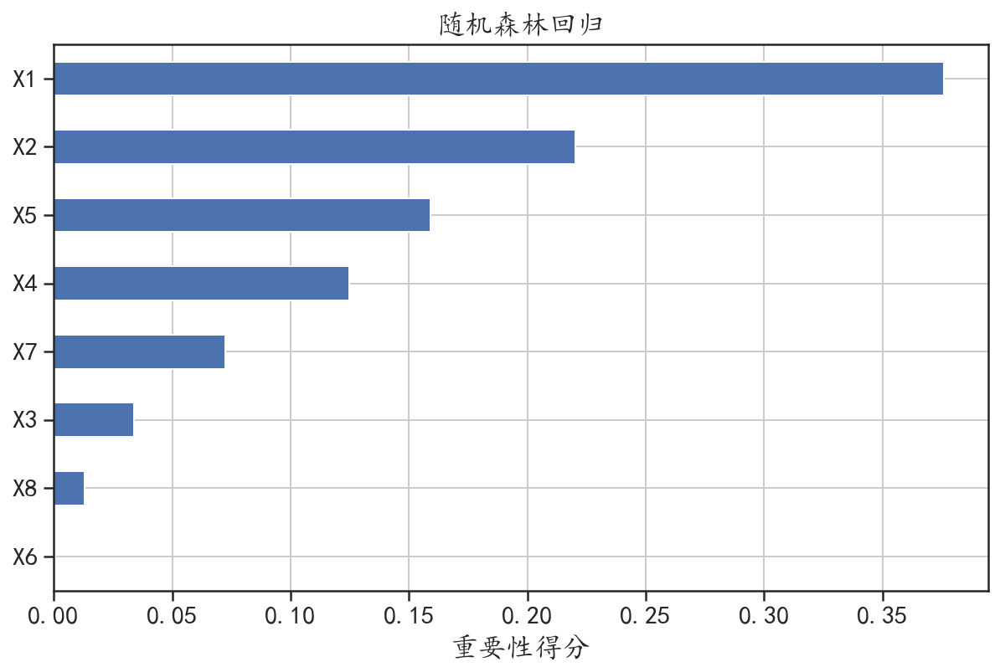

In [45]:
## 使用条形图可视化每个变量的重要性
importances = pd.DataFrame({"feature":X_trainenb.columns,
                            "importance":rfr1.feature_importances_})
importances = importances.sort_values("importance",ascending = True)
importances.plot(kind="barh",figsize=(10,6),x = "feature",y = "importance",
                 legend = False)
plt.xlabel("重要性得分")
plt.ylabel("")
plt.title("随机森林回归")
plt.grid()
plt.show()

In [46]:
## 分析随着树数目的变化，在测试和训练集上的预测效果
n_estimator = np.arange(50,1000,50)
train_mse = []
test_mse = []
for n in n_estimator:
    rfr1.set_params(n_estimators = n)  #设置参数
    rfr1.fit(X_trainenb,y_trainenb)    #训练模型
    rfr1_lab = rfr1.predict(X_trainenb)
    rfr1_pre = rfr1.predict(X_testenb)
    train_mse.append(mean_squared_error(y_trainenb,rfr1_lab))
    test_mse.append(mean_squared_error(y_testenb,rfr1_pre))

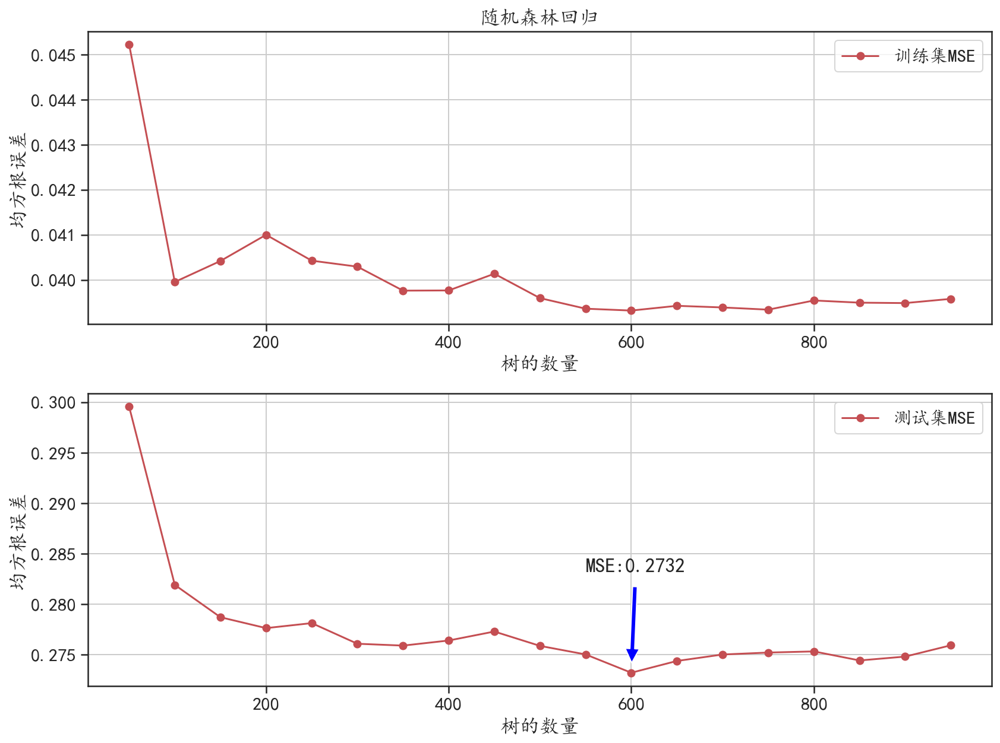

In [47]:
## 可视化不同数目的树情况下，在训练集和测试集上的均方根误差
plt.figure(figsize=(12,9))
plt.subplot(2,1,1)
plt.plot(n_estimator, train_mse, "r-o",
         label = "训练集MSE")
plt.xlabel("树的数量")
plt.ylabel("均方根误差")
plt.title("随机森林回归")
plt.grid()
plt.legend()

plt.subplot(2,1,2)
plt.plot(n_estimator, test_mse, "r-o",
         label = "测试集MSE")
index = np.argmin(test_mse)
plt.annotate("MSE:"+str(round(test_mse[index],4)), 
             xy=(n_estimator[index],test_mse[index]),
             xytext=(n_estimator[index]-50,test_mse[index]+0.01),
             arrowprops=dict(facecolor='blue', shrink=0.1))
plt.xlabel("树的数量")
plt.ylabel("均方根误差")
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()
## 可以发现在树的数量等于600的时候，预测效果最好小于0.275

### 8.4 AdaBoost模型


#### 8.4.1 AdaBoost模型数据分类


In [48]:
## 使用AdaBoost分类模型
## 使用决策树作为基础的学习器
dtc = DecisionTreeClassifier(max_depth=1,random_state = 1) 
abc = AdaBoostClassifier(base_estimator=dtc, # 使用的基础学习器
                         n_estimators= 50, ## 学习器的数量
                         learning_rate= 0.5, ## 学习速率
                         random_state=1)
abc = abc.fit(X_train,y_train)
## 计算在训练和和验证集上的预测精度
abc_lab = abc.predict(X_train)
abc_pre = abc.predict(X_val)
print("训练数据集上的精度:",accuracy_score(y_train,abc_lab))
print("验证数据集上的精度:",accuracy_score(y_val,abc_pre))


训练数据集上的精度: 0.844311377245509
验证数据集上的精度: 0.8071748878923767


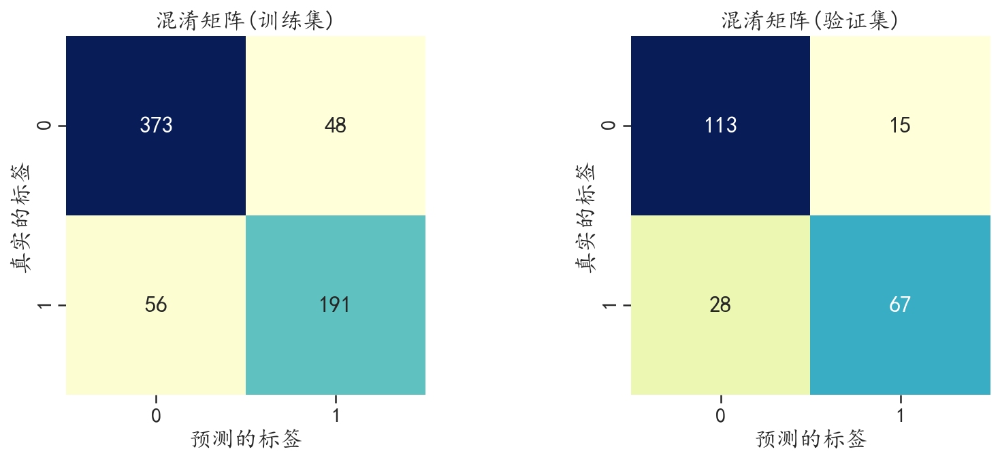

In [49]:
## 可视化在训练数据和验证数据上的混淆矩阵
train_confm = confusion_matrix(y_train,abc_lab)
val_confm = confusion_matrix(y_val,abc_pre)
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.heatmap(train_confm, square=True, annot=True, fmt='d',
            cbar=False,cmap="YlGnBu")
plt.xlabel("预测的标签")
plt.ylabel("真实的标签")
plt.title("混淆矩阵(训练集)")
plt.subplot(1,2,2)
sns.heatmap(val_confm, square=True, annot=True, fmt='d',
            cbar=False,cmap="YlGnBu")
plt.xlabel("预测的标签")
plt.ylabel("真实的标签")
plt.title("混淆矩阵(验证集)")
plt.tight_layout()
plt.show()

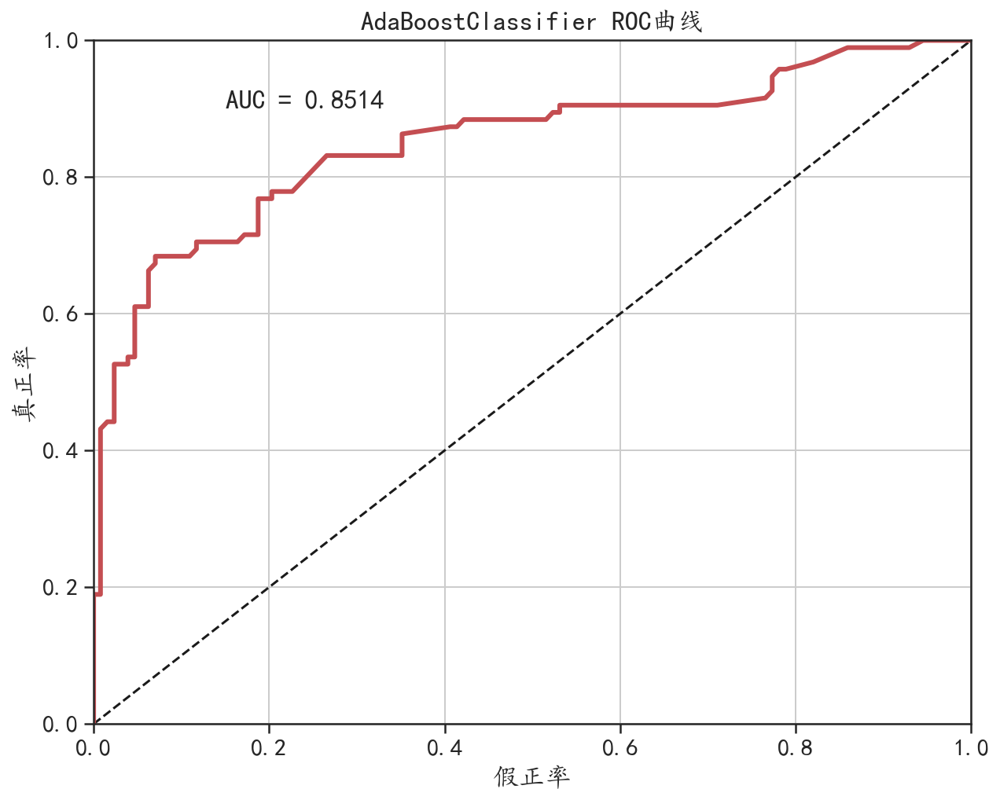

In [50]:
## 可视化在验证集上的Roc曲线
pre_y = abc.predict_proba(X_val)[:, 1]
fpr_Nb, tpr_Nb, _ = roc_curve(y_val, pre_y)
aucval = auc(fpr_Nb, tpr_Nb)    # 计算auc的取值
plt.figure(figsize=(10,8))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_Nb, tpr_Nb,"r",linewidth = 3)
plt.grid()
plt.xlabel("假正率")
plt.ylabel("真正率")
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.title("AdaBoostClassifier ROC曲线")
plt.text(0.15,0.9,"AUC = "+str(round(aucval,4)))
plt.show()

In [51]:
## 分析基础学习器的max_depth对训练集和测试集精度的影响
maxdepth = np.arange(1,21)
train_acc = []
val_acc = []
for depth in maxdepth:
    dtc = DecisionTreeClassifier(max_depth=depth,random_state = 1) 
    abc = AdaBoostClassifier(base_estimator=dtc, # 使用的基础学习器
                             n_estimators= 50,   # 学习器的数量
                             learning_rate= 0.5, # 学习速率
                             random_state=1)
    abc = abc.fit(X_train,y_train)
    ## 计算在训练和和验证集上的预测精度
    abc_lab = abc.predict(X_train)
    abc_pre = abc.predict(X_val)
    train_acc.append(accuracy_score(y_train,abc_lab))
    val_acc.append(accuracy_score(y_val,abc_pre))


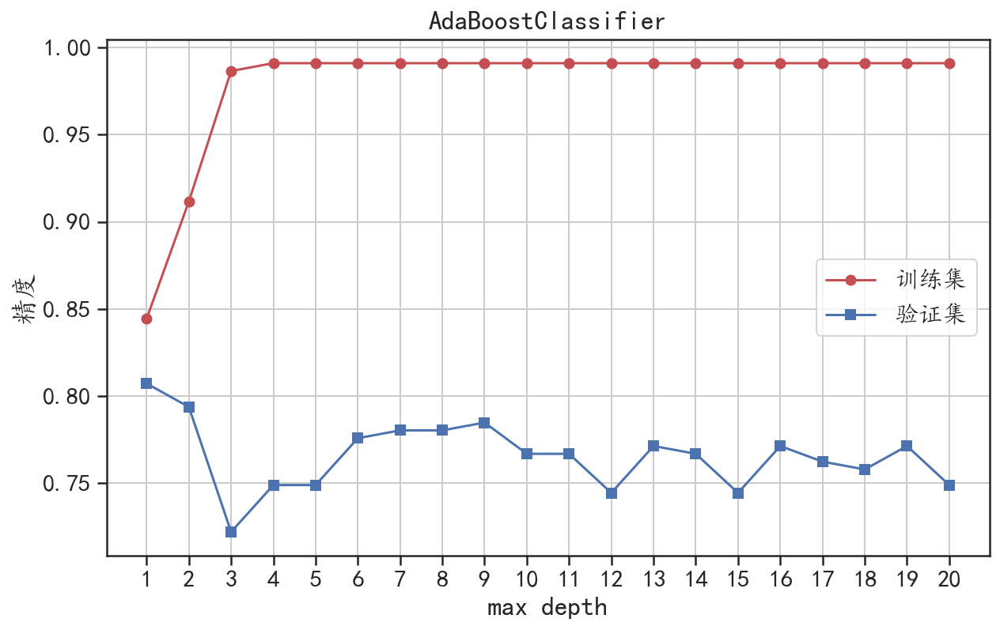

In [52]:
## 可视化max_depth对训练集和验证集精度的影响
plt.figure(figsize=(10,6))
plt.plot(maxdepth,train_acc,"r-o",label = "训练集")
plt.plot(maxdepth,val_acc,"b-s",label = "验证集")
plt.xticks(maxdepth,maxdepth)
plt.legend()
plt.grid()
plt.xlabel("max depth")
plt.ylabel("精度")
plt.title("AdaBoostClassifier")
plt.show()

## 可以发现随着深度的增加，训练集上的精度逐渐接近1，但是在验证集上的精度是下降的

#### 8.4.2 AdaBoost模型数据回归


In [53]:
## 使用AdaBoostRegressor对数据建立回归模型
dtr = DecisionTreeRegressor(max_depth=3,random_state=1)
adr = AdaBoostRegressor(base_estimator = dtr,
                        n_estimators =50,
                        learning_rate = 0.8,
                        random_state=1)
adr = adr.fit(X_trainenb,y_trainenb)
## 计算在训练和和测试集上的预测均方根误差
adr_lab = adr.predict(X_trainenb)
adr_pre = adr.predict(X_testenb)
print("训练数据集上的均方根误差:",mean_squared_error(y_trainenb,adr_lab))
print("测试数据集上的均方根误差:",mean_squared_error(y_testenb,adr_pre))

## 学习得到的模型在数据上的预测误差较大

训练数据集上的均方根误差: 2.8879098492240614
测试数据集上的均方根误差: 3.4014054826488924


In [54]:
## 分析基础学习器的max_depth对训练集和测试集误差的影响
maxdepth = np.arange(1,21)
train_mse = []
test_mse = []
for depth in maxdepth:
    dtr = DecisionTreeRegressor(max_depth=depth,random_state = 1) 
    abr = AdaBoostRegressor(base_estimator=dtr, # 使用的基础学习器
                             n_estimators= 50,   # 学习器的最大估计量
                             learning_rate= 0.8, # 学习速率
                             random_state=1)
    abr = abr.fit(X_trainenb,y_trainenb)
    ## 计算在训练和和测试集上的预测误差
    abr_lab = abr.predict(X_trainenb)
    abr_pre = abr.predict(X_testenb)
    train_mse.append(mean_squared_error(y_trainenb,abr_lab))
    test_mse.append(mean_squared_error(y_testenb,abr_pre))


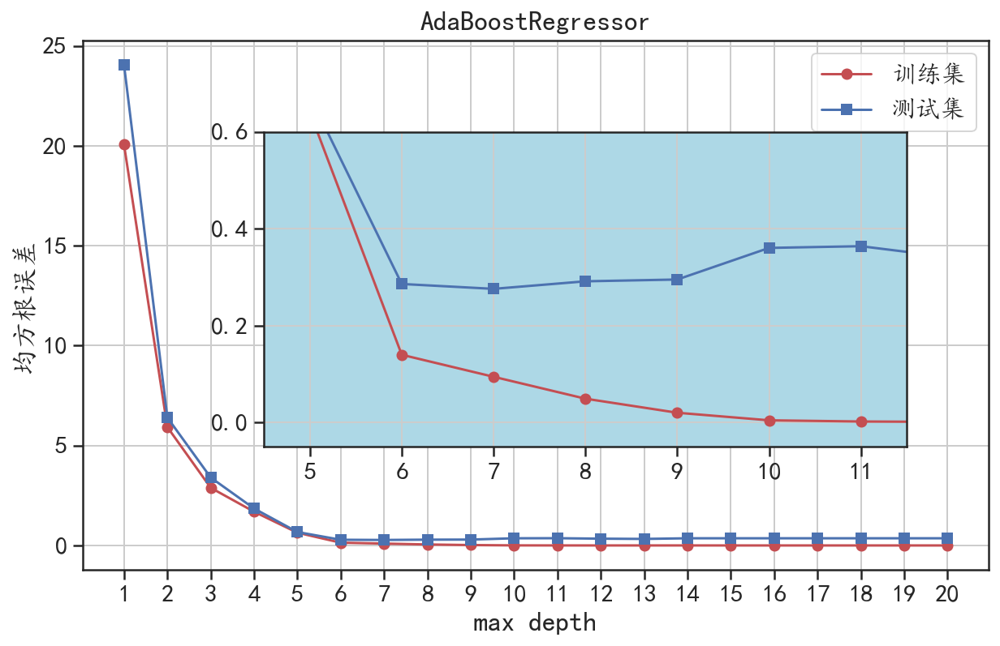

In [55]:
## 可视化max_depth的训练集和验证集预测误差的影响
fig = plt.figure(figsize=(10,6))
plt.plot(maxdepth,train_mse,"r-o",label = "训练集")
plt.plot(maxdepth,test_mse,"b-s",label = "测试集")
plt.xticks(maxdepth,maxdepth)
plt.legend()
plt.grid()
plt.xlabel("max depth")
plt.ylabel("均方根误差")
plt.title("AdaBoostRegressor")
## 添加局部放大图像
inset_ax = fig.add_axes([0.28, 0.3, .55, .45],
                        facecolor="lightblue")
inset_ax.plot(maxdepth,train_mse,"r-o")
inset_ax.plot(maxdepth,test_mse,"b-s")
inset_ax.set_xlim([4.5,11.5])
inset_ax.set_ylim([-0.05,0.6])
inset_ax.grid()
plt.show()

## 可以发现随着深度的增加，训练集上的预测误差逐渐接近0，但是在测试集上的预测误差在maxdepth=8时取值最小

In [56]:
## 使用max_depth = 8建立AdaBoostRegressor
dtr = DecisionTreeRegressor(max_depth=8,random_state=1)
adr = AdaBoostRegressor(base_estimator = dtr,
                        n_estimators =50,
                        learning_rate = 0.8,
                        random_state=1)
adr = adr.fit(X_trainenb,y_trainenb)
## 计算在训练和和测试集上的预测均方根误差
adr_lab = adr.predict(X_trainenb)
adr_pre = adr.predict(X_testenb)
print("训练数据集上的均方根误差:",mean_squared_error(y_trainenb,adr_lab))
print("测试数据集上的均方根误差:",mean_squared_error(y_testenb,adr_pre))


训练数据集上的均方根误差: 0.049513571889752785
测试数据集上的均方根误差: 0.29162199169815756


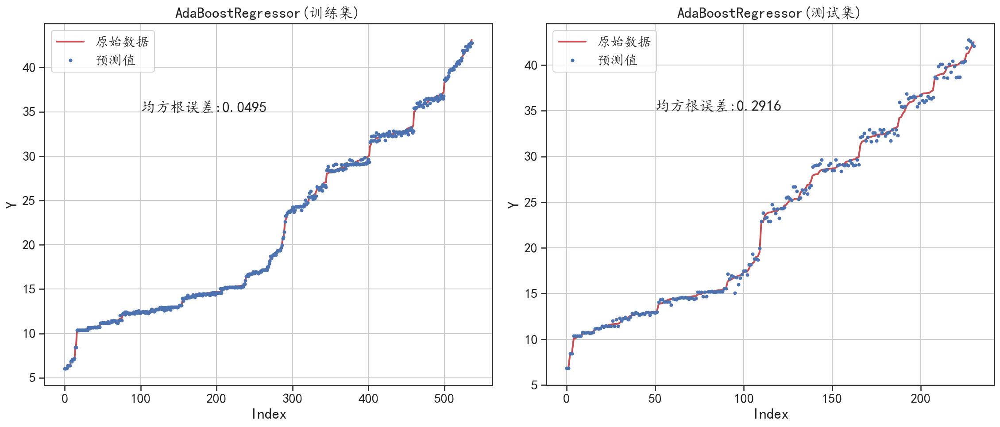

In [57]:
## 可视化出在训练集和测试集上的预测效果
plt.figure(figsize=(16,7))
plt.subplot(1,2,1) ## 训练数据结果可视化
rmse = round(mean_squared_error(y_trainenb,adr_lab),4)
index = np.argsort(y_trainenb)
plt.plot(np.arange(len(index)),y_trainenb.values[index],"r",
         linewidth=2, label = "原始数据")
plt.plot(np.arange(len(index)),adr_lab[index],"bo",
         markersize=3,label = "预测值")
plt.text(100,35,s = "均方根误差:"+str(rmse))
plt.legend()
plt.grid()
plt.xlabel("Index")
plt.ylabel("Y")
plt.title("AdaBoostRegressor(训练集)")

plt.subplot(1,2,2)   ## 测试数据结果可视化
rmse = round(mean_squared_error(y_testenb,adr_pre),4)
index = np.argsort(y_testenb)
plt.plot(np.arange(len(index)),y_testenb.values[index],"r",
         linewidth=2, label = "原始数据")
plt.plot(np.arange(len(index)),adr_pre[index],"bo",
         markersize=3,label = "预测值")
plt.text(50,35,s = "均方根误差:"+str(rmse))
plt.legend()
plt.grid()
plt.xlabel("Index")
plt.ylabel("Y")
plt.title("AdaBoostRegressor(测试集)")
plt.tight_layout()
plt.show()

### 8.5 梯度提升树（GBDT）

#### 8.5.1 梯度提升树（GBDT）模型数据分类

In [58]:
## 使用参数网格搜索寻找合适的GBDT参数用于模型的建立
gbdt = GradientBoostingClassifier(random_state=1) ## 定义模型
## 定义需要搜索的参数
learning_rate = [0.01,0.1,0.5,1,10]  # 学习速率
n_estimators = [100,200,500,800]     # 学习器的数量
max_depth = [3,5,8,10]               #  最大深度
max_features = ["sqrt","log2"]
para_grid = [{"learning_rate":learning_rate,"n_estimators":n_estimators,
              "max_depth" : max_depth,"max_features":max_features}]

## 使用3折交叉验证进行参数搜索
gs_gbdt = GridSearchCV(estimator=gbdt,param_grid=para_grid,cv=3,n_jobs=4)
gs_gbdt.fit(X_train, y_train) # 使用训练集进行训练
## 输出最好的模型参数
print(gs_gbdt.best_params_)

{'learning_rate': 0.1, 'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 200}


In [59]:
## 使用训练好的最优模型，计算在训练和和验证集上的预测精度
gbdt1_lab = gs_gbdt.best_estimator_.predict(X_train)
gbdt1_pre = gs_gbdt.best_estimator_.predict(X_val)
print("训练数据集上的精度:",accuracy_score(y_train,gbdt1_lab))
print("验证数据集上的精度:",accuracy_score(y_val,gbdt1_pre))


训练数据集上的精度: 0.9146706586826348
验证数据集上的精度: 0.7937219730941704


In [60]:
## 将输出的所有搜索结果进行处理
results = pd.DataFrame(gs_gbdt.cv_results_)
## 输出感兴趣的结果
results2 = results[["mean_test_score","std_test_score","params"]]
results2.sort_values("mean_test_score",ascending=False).head()

,mean_test_score,std_test_score,params
33,0.832330,0.018474,"{'learning_rate': 0.1, 'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 200}"
37,0.832330,0.018474,"{'learning_rate': 0.1, 'max_depth': 3, 'max_features': 'log2', 'n_estimators': 200}"
13,0.830856,0.008910,"{'learning_rate': 0.01, 'max_depth': 5, 'max_features': 'log2', 'n_estimators': 200}"
9,0.830856,0.008910,"{'learning_rate': 0.01, 'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 200}"
2,0.830842,0.033000,"{'learning_rate': 0.01, 'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 500}"


#### 8.5.2 梯度提升树（GBDT）模型数据回归

In [61]:
## 网格搜索找到合适的模型
gbdt_r = GradientBoostingRegressor(random_state=1) ## 定义模型
## 定义需要搜索的参数
learning_rate = [0.001,0.01,0.1,0.5,1] ## 学习速率
n_estimators = [100,200,500,800]  ## 基础学习器的数量
max_depth = [3,5,8,10]             #  最大深度
para_grid = [{"learning_rate":learning_rate,"n_estimators":n_estimators,
              "max_depth":max_depth}]

## 使用5折交叉验证进行参数搜索
gs_gbdt_r = GridSearchCV(estimator=gbdt_r,param_grid=para_grid,cv=5,n_jobs=4)
gs_gbdt_r.fit(X_trainenb, y_trainenb) # 使用训练集进行训练
## 输出最好的模型参数
print(gs_gbdt_r.best_params_)

{'learning_rate': 0.5, 'max_depth': 3, 'n_estimators': 500}


In [62]:
## 计算在训练和和测试集上的预测均方根误差
gbdtr_lab = gs_gbdt_r.best_estimator_.predict(X_trainenb)
gbdtr_pre = gs_gbdt_r.best_estimator_.predict(X_testenb)
print("训练数据集上的均方根误差:",mean_squared_error(y_trainenb,gbdtr_lab))
print("测试数据集上的均方根误差:",mean_squared_error(y_testenb,gbdtr_pre))

训练数据集上的精度: 0.029848707941136674
测试数据集上的精度: 0.1300796795178827


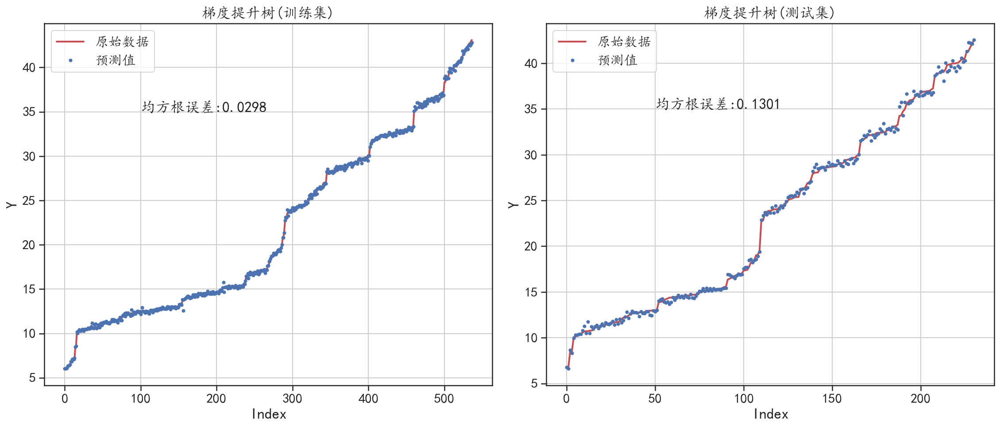

In [63]:
## 可视化出在训练集和测试集上的预测效果
plt.figure(figsize=(16,7))
plt.subplot(1,2,1) ## 训练数据结果可视化
rmse = round(mean_squared_error(y_trainenb,gbdtr_lab),4)
index = np.argsort(y_trainenb)
plt.plot(np.arange(len(index)),y_trainenb.values[index],"r",
         linewidth=2, label = "原始数据")
plt.plot(np.arange(len(index)),gbdtr_lab[index],"bo",
         markersize=3,label = "预测值")
plt.text(100,35,s = "均方根误差:"+str(rmse))
plt.legend()
plt.grid()
plt.xlabel("Index")
plt.ylabel("Y")
plt.title("梯度提升树(训练集)")
## 测试数据结果可视化
plt.subplot(1,2,2)
rmse = round(mean_squared_error(y_testenb,gbdtr_pre),4)
index = np.argsort(y_testenb)
plt.plot(np.arange(len(index)),y_testenb.values[index],"r",
         linewidth=2, label = "原始数据")
plt.plot(np.arange(len(index)),gbdtr_pre[index],"bo",
         markersize=3,label = "预测值")
plt.text(50,35,s = "均方根误差:"+str(rmse))
plt.legend()
plt.grid()
plt.xlabel("Index")
plt.ylabel("Y")
plt.title("梯度提升树(测试集)")
plt.tight_layout()
plt.show()

##### 分类模型和回归模型的预测效果总结

|算法|训练集精度(分类)|验证集精度(分类)|训练集MSE(回归)|测试集MSE(回归)|
|:---:|:---:|:---:|:---:|:---:|
|决策树(DT)|0.8428|0.8116|0.1281|0.2888|
|随机森林(RF)|0.8622|0.8116|0.0393|0.2721|
|AdaBoost|0.8443|0.8071|0.0505|0.2865|
|梯度提升树(GBDT)|0.8742|0.7937|0.0298|0.1300|